# Machine Learning for Product Classification: The Otto Group Challenge

<img src="https://i.imgur.com/VQUy4bh.png" alt="Product Classification" />


Use the "Run" button to execute the code.

## Introduction : Product classifcation

<p>The Otto Group is one of the world's biggest e-commerce companies, with subsidiaries in more than 20 countries. They sell millions of products worldwide every day, with several thousand products being added to their product line.</p>

<p>A consistent analysis of the performance of their products is crucial for the Otto Group. However, due to their diverse global infrastructure, many identical products get classified differently. This makes it difficult to accurately track the performance of their products and generate insights about their product range.</p>




### Business Problem

<p>The Otto Group is looking to use machine learning to improve the accuracy of their product classification. They have a dataset of 93 features for more than 200,000 products. The objective of the Otto Group Product Classification Challenge is to build a predictive model that can distinguish between their main product categories.</p>

### Evaluation Metric

<p>The Kaggle use <b>multi-class logarithmic loss</b> as Evaluation Metric. This is a measure of how well the predicted probabilities match the true labels. The formula is:</p>

<p>
<img src="https://i.imgur.com/WcQomak.png" alt="Eval_metrics" width="auto" height="auto">

</p>


<p>
where:
</p>

<ul>
<li>N is the number of products in the test set</li>
<li>M is the number of class labels</li>
<li>log is the natural logarithm</li>
<li>yij is 1 if observation i is in class j and 0 otherwise</li>
<li>pij is the predicted probability that observation i belongs to class j</li>
<li>wi is a weight that is used to balance the importance of different classes</li>
</ul>





## Machine Learning Pipeline

<ul>
<li>Install and Import libraries</li>
<li>Downloading and Explore the dataset</li>
<li>EDA - exploratory data analysis</li>
<li>Feature Engineering</li>
<li>Data preparation - Train, Val Split, selecting input features and Scaling</li>
<li>Define Helper Functions and evaluation metrics</li>
<li>Define Hardcode Model and baseline model</li>
<li>Train and Evaluate best model without hyperparameter tuning</li>
<li>Hyperparameter tuning for select models</li>
<li>Make predictions</li>
<li>Submitting to Kaggle</li>
<li>Summarise insights and learning</li>
<li>References</li>
</ul>


## Install and Import libraries

In [1]:
! pip install pandas==1.5.3 --quiet
! pip install jovian plotly matplotlib  seaborn  opendatasets  scikit-learn  --quiet --upgrade

In [2]:
import jovian
import os
import opendatasets as od
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#from google.colab import drive
import os
import subprocess

%matplotlib inline
# Default parms for seaborn & mathplotlib
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Downloading and Explore the dataset
### Downloading the dataset from Kaggle

In [3]:
# Downloading Kaggle dataset
kaggle_url = 'https://www.kaggle.com/competitions/otto-group-product-classification-challenge'
od.download(kaggle_url)

Skipping, found downloaded files in "./otto-group-product-classification-challenge" (use force=True to force download)


In [4]:
!pwd

/home/haridev/otto-group-product-classification-challenge-improving-product-classification-accuracy-with


In [3]:
#File Path set according to where you run the noebook locally or colab
file_path = '/home/haridev/otto-group-product-classification-challenge-improving-product-classification-accuracy-with/otto-group-product-classification-challenge/'

In [4]:
#Files provided by Kaggle
file_name = os.listdir(file_path)
print( 'CSV Files present: {}'.format(file_name))

CSV Files present: ['sampleSubmission.csv', 'train.csv', 'test.csv']


In [7]:
!wc -l {file_path+'train.csv'} | cut -c-5

61879


The train set is of `61.8K` records and `93` Columns.

In [5]:
#Loading all the data set to DataFrame
train_df =  pd.read_csv(file_path+'train.csv',low_memory=False)
sample_submission_df =  pd.read_csv(file_path+'sampleSubmission.csv',low_memory=False)
test_df =  pd.read_csv(file_path+'test.csv',low_memory=False)

In [6]:
train_df.head(10)

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,target
0,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,Class_1
1,2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Class_1
2,3,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Class_1
3,4,1,0,0,1,6,1,5,0,0,...,0,1,2,0,0,0,0,0,0,Class_1
4,5,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Class_1
5,6,2,1,0,0,7,0,0,0,0,...,0,3,0,0,0,0,2,0,0,Class_1
6,7,2,0,0,0,0,0,0,2,0,...,1,1,0,0,0,0,0,0,1,Class_1
7,8,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,Class_1
8,9,0,0,0,0,0,0,0,4,0,...,0,2,0,0,0,0,0,0,1,Class_1
9,10,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,Class_1


Wow! Thats a lot of features for a data set...

In [6]:
sample_submission_df.head(4)

,id,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,1,1,0,0,0,0,0,0,0,0
1,2,1,0,0,0,0,0,0,0,0
2,3,1,0,0,0,0,0,0,0,0
3,4,1,0,0,0,0,0,0,0,0


In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61878 entries, 0 to 61877
Data columns (total 95 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       61878 non-null  int64 
 1   feat_1   61878 non-null  int64 
 2   feat_2   61878 non-null  int64 
 3   feat_3   61878 non-null  int64 
 4   feat_4   61878 non-null  int64 
 5   feat_5   61878 non-null  int64 
 6   feat_6   61878 non-null  int64 
 7   feat_7   61878 non-null  int64 
 8   feat_8   61878 non-null  int64 
 9   feat_9   61878 non-null  int64 
 10  feat_10  61878 non-null  int64 
 11  feat_11  61878 non-null  int64 
 12  feat_12  61878 non-null  int64 
 13  feat_13  61878 non-null  int64 
 14  feat_14  61878 non-null  int64 
 15  feat_15  61878 non-null  int64 
 16  feat_16  61878 non-null  int64 
 17  feat_17  61878 non-null  int64 
 18  feat_18  61878 non-null  int64 
 19  feat_19  61878 non-null  int64 
 20  feat_20  61878 non-null  int64 
 21  feat_21  61878 non-null  int64 
 22

## EDA - exploratory data analysis

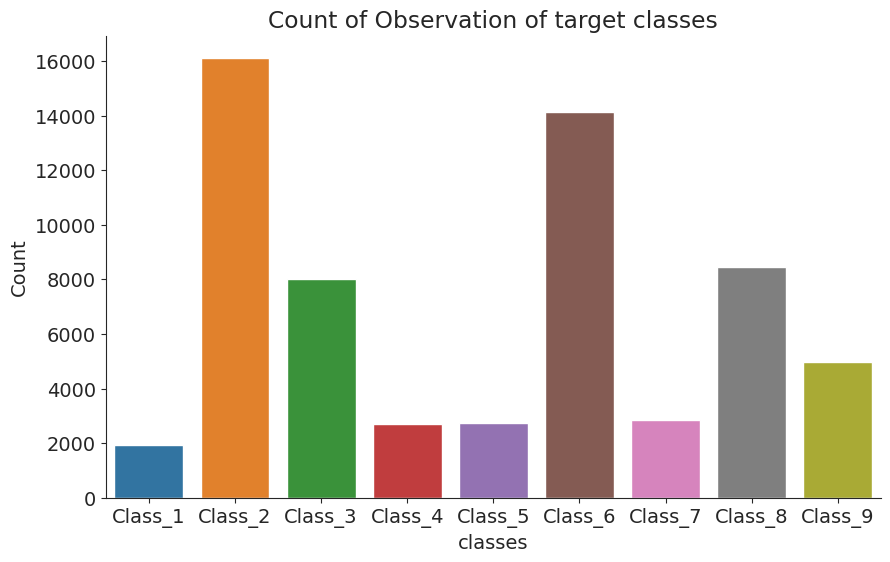

In [10]:
#lets count the target and plot the count graph
sns.countplot(x=train_df.target)
sns.despine();
plt.xlabel('classes')
plt.ylabel('Count')
plt.title('Count of Observation of target classes')
plt.show()

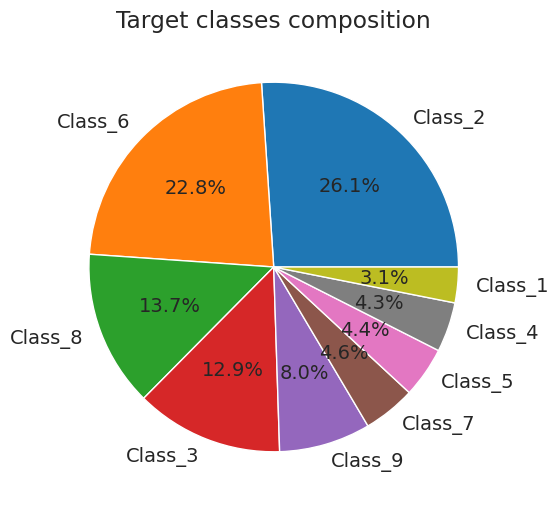

In [6]:
pie_data =train_df.target.value_counts()
plt.pie(pie_data.values, labels=pie_data.index, autopct="%1.1f%%")
plt.title('Target classes composition')
plt.show()

> **Inference** :Class_2 seems to be having high count followed by class_6 and class_1 is the least.

### Univariant Analysis

In [57]:
fig, axes = plt.subplots(nrows=47, ncols=2, figsize=(20,300))
fig.subplots_adjust(hspace=0.4, top=0.85)

axes = axes.flat
for i in range(93):    
    plt.yticks(range(0, 14, 2), fontsize=5, rotation=45)
    plt.yticks(fontsize=10)
    plt.ylim(20)
    
    plt.grid(which='major', axis='y', linestyle='-')    
    sns.countplot(y=train_df.iloc[:,i+1], data=train_df, ax=axes[i],
                  palette="rainbow")
    sns.despine()
    
plt.tight_layout()
fig.suptitle("Univarient Analysis of Features", y=1.005, fontsize=30) 


Text(0.5, 1.005, 'Univarient Analysis of Features')

> **Inference** : The univariant analysis of the above data shows that most of the values are concentrated around 3. However, there are some features with values above 300. Therefore, it is best to  standardizing the value ranges of all the features before feeding them into the model.


### Correlation

In [7]:
ordinal_target = {
    'Class_1':1,
    'Class_2':2,
    'Class_3':3,
    'Class_4':4,
    'Class_5':5,
    'Class_6':6,
    'Class_7':7,
    'Class_8':8,
    'Class_9':9,
    
    
}

train_df['target_ord']=train_df.loc[:,'target'].map(ordinal_target)
train_df

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,target,target_ord
0,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Class_1,1
1,2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,Class_1,1
2,3,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,Class_1,1
3,4,1,0,0,1,6,1,5,0,0,...,1,2,0,0,0,0,0,0,Class_1,1
4,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,Class_1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61873,61874,1,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,2,0,Class_9,9
61874,61875,4,0,0,0,0,0,0,0,0,...,2,0,0,2,0,0,1,0,Class_9,9
61875,61876,0,0,0,0,0,0,0,3,1,...,3,1,0,0,0,0,0,0,Class_9,9
61876,61877,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,3,10,0,Class_9,9


In [8]:
corr = train_df.iloc[:,1:].corr()
#cm = sns.light_palette("orange", as_cmap=True)
corr = corr.style.background_gradient(cmap='plasma')
corr

/tmp/ipykernel_88/1178770498.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = train_df.iloc[:,1:].corr()


> **Inference** : The correlation heatmap shows that the target variable has a low correlation with most of the features. However, there are two features, feat_14 and feat_15, with which the target variable has a higher correlation.

### Bivarient Analysis

Target vs All Features `------>` checking for patterns / groups or Clusters

In [58]:
fig, axes = plt.subplots(nrows=31, ncols=3, figsize=(20,300))
#fig.title(") 
feature = train_df.columns
axes = axes.flat
for i in range(93):
    feat=feature[i+1]
    sns.scatterplot(data = train_df, x = feat,y = 'target', s=100,hue =  'target',ax =axes[i])    
    sns.despine()
plt.tight_layout()
fig.suptitle("Bivarient Analysis:  Features Vs Target", y=1.005, fontsize=30)

Text(0.5, 1.005, 'Bivarient Analysis:  Features Vs Target')

> **Inference** : All 93 features were numeric, so we investigated their value distributions with respect to the predicted outcome classes. Some features have a limited number of values and can be treated as categorical values during feature engineering. It might also be worth standardizing the value ranges for all features.

## Feature Engineering

### Principal component analysis

In [10]:
from sklearn.decomposition import PCA

In [11]:
pca = PCA()
pca.fit(train_df.iloc[:,1:-2])

PCA()

In [12]:
#Principle component importance:
pca.explained_variance_ratio_

array([1.17720718e-01, 8.61454873e-02, 6.38820619e-02, 6.12869776e-02,
       4.40923889e-02, 3.96994124e-02, 3.48913834e-02, 3.15006368e-02,
       2.93800155e-02, 2.74616243e-02, 2.59325283e-02, 2.22510699e-02,
       2.16183939e-02, 1.97054896e-02, 1.92254258e-02, 1.86070118e-02,
       1.75187188e-02, 1.70539680e-02, 1.54994431e-02, 1.41389780e-02,
       1.24438062e-02, 1.18255063e-02, 1.07023381e-02, 1.01637093e-02,
       1.00072059e-02, 9.28325860e-03, 8.60023694e-03, 8.26431335e-03,
       8.12392270e-03, 7.50500886e-03, 7.44165221e-03, 7.03244706e-03,
       6.93990509e-03, 6.74171371e-03, 6.58234251e-03, 6.26044991e-03,
       6.07080798e-03, 5.96052635e-03, 5.68671856e-03, 5.47887829e-03,
       5.24142823e-03, 4.96349508e-03, 4.81403596e-03, 4.69857492e-03,
       4.49140705e-03, 4.04605406e-03, 3.93587084e-03, 3.86767490e-03,
       3.65515453e-03, 3.42131777e-03, 3.36416408e-03, 3.14576471e-03,
       3.07681312e-03, 2.98628443e-03, 2.76490752e-03, 2.73704392e-03,
      

In [13]:
# The contribution of the Features to the principle component
print(pca.components_)

[[ 0.02493404  0.07082511 -0.00952277 ...  0.02979637 -0.00447001
   0.01638788]
 [-0.01688881  0.04450122  0.34321009 ... -0.00464523  0.01950802
   0.00058025]
 [ 0.04352114 -0.02966854  0.10438784 ...  0.01806655  0.00756774
   0.01054897]
 ...
 [ 0.0130984   0.01891848  0.00391732 ...  0.00146211  0.00687257
   0.00315459]
 [ 0.00660278 -0.00067925  0.00436776 ... -0.000572   -0.00838975
  -0.00263092]
 [-0.00098523  0.00472426  0.00122579 ...  0.00070034 -0.00123987
   0.00065955]]


In [14]:
cumulative_var = np.cumsum(pca.explained_variance_ratio_)
x=pca.get_feature_names_out()
y=cumulative_var
# Create a scatterplot
fig = px.scatter(x=x, y=y)
fig.update_xaxes(title_text="Number of Components")
fig.update_yaxes(title_text="Cumulative Explained Variance")
fig.update_layout( 
    title="Scree Plot")

fig.show()

>**Inference** : <p>Principal component analysis (PCA) and the resulting scree plot revealed that around 68 components are sufficient to capture the collective variability among all feature variables. This means that a significant portion of the variability in the data can be explained by only 68 principal components, rather than the original 93 features.</p>

> <p>Although we opted to keep all features during the project, principal components after the 68th could be dropped from the model as a means of dimension reduction. This is because these components do not contribute much to the cumulative variance, and dropping them would simplify the model without significantly impacting its performance.</p>

### Feature Creation

Creation aditional Features like aggregation sum , variance & count of Zeros from feature 1 - 93

In [15]:
sum_1 = train_df.iloc[:,1:-2].sum(axis=1)
var_1 = train_df.iloc[:,1:-2].var(axis=1)
temp=train_df.iloc[:,1:-2] ==0



In [16]:
feat_count_1 = list()
for i in range(0,temp.shape[0]):
    feat_count_1.append( temp.iloc[i].value_counts()[False])


In [17]:
train_df.insert(94,'feat_sum',sum_1)
train_df.insert(94,'feat_var',var_1)
train_df.insert(94,'feat_count',feat_count_1)



In [18]:
train_df 

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_89,feat_90,feat_91,feat_92,feat_93,feat_count,feat_var,feat_sum,target,target_ord
0,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,23,2.359046,51,Class_1,1
1,2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,10,0.157083,12,Class_1,1
2,3,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,8,0.477092,14,Class_1,1
3,4,1,0,0,1,6,1,5,0,0,...,0,0,0,0,0,38,42.362085,163,Class_1,1
4,5,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,11,0.518467,20,Class_1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61873,61874,1,0,0,1,1,0,0,0,0,...,0,0,0,2,0,42,60.796166,233,Class_9,9
61874,61875,4,0,0,0,0,0,0,0,0,...,2,0,0,1,0,19,2.100514,47,Class_9,9
61875,61876,0,0,0,0,0,0,0,3,1,...,0,0,0,0,0,15,7.716924,64,Class_9,9
61876,61877,1,0,0,0,0,0,0,0,0,...,1,0,3,10,0,22,2.033894,50,Class_9,9


## Data preparation - Train, Val Split, selecting input features and Scaling

In [19]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
#Helper Function for Scaling
def data_scale ( df ):
    scalar = MinMaxScaler()
    return scalar.fit_transform(df)    
    

### Training & Validation Set Split

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
train_data_df, val_data_df = train_test_split(train_df, test_size=0.2, random_state=50)

In [22]:
print ('Traning set Shape: {}\nValidation Set Shape: {}'.format(train_data_df.shape, val_data_df.shape))

Traning set Shape: (49502, 99)
Validation Set Shape: (12376, 99)


In [23]:
input_column = list(train_df.columns[1:-2])
target_column = train_df.columns[-2]
target_column_ord = train_df.columns[-1]
train_input = train_data_df[input_column]
train_target = train_data_df[target_column]
train_target_ord = train_data_df[target_column_ord]
val_input = val_data_df[input_column]
val_target = val_data_df[target_column]
val_target_ord = val_data_df[target_column_ord]

Scaling the data set

In [24]:
train_input_scaled = pd.DataFrame(data_scale(train_input),columns=input_column)
val_input_scaled = pd.DataFrame(data_scale(val_input),columns=input_column)

In [25]:
train_input_scaled

,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,feat_10,...,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,feat_count,feat_var,feat_sum
0,0.032787,0.019608,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.000000,0.015385,0.000000,0.000000,0.0,0.462687,0.003902,0.155932
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.019231,0.000000,0.0,0.253731,0.006342,0.108475
2,0.016393,0.000000,0.000000,0.028571,0.000000,0.1,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.038462,0.057692,0.000000,0.0,0.373134,0.007708,0.142373
3,0.000000,0.000000,0.000000,0.000000,0.052632,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.019231,0.000000,0.0,0.149254,0.002155,0.055932
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.089552,0.000564,0.033898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49497,0.000000,0.000000,0.016393,0.014286,0.052632,0.1,0.0,0.026316,0.0,0.033333,...,0.104478,0.0,0.098361,0.000000,0.038462,0.000000,0.0,0.761194,0.036591,0.396610
49498,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.238806,0.002200,0.069492
49499,0.000000,0.000000,0.065574,0.185714,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.052632,0.0,0.313433,0.003704,0.122034
49500,0.000000,0.000000,0.081967,0.100000,0.052632,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.016393,0.000000,0.019231,0.000000,0.0,0.462687,0.005675,0.174576


## Define Helper and evaluation metrics Functions 

In [26]:
from sklearn.metrics import classification_report,log_loss,accuracy_score
from  sklearn.linear_model import LogisticRegression

In [27]:
def eval_report(y_pred,y_pred_prob, y_true):
    loss = log_loss(y_true, y_pred_prob)
    print("Multi-class Log Loss:", loss)
    print(classification_report(y_true,y_pred))    

In [28]:
def model_train(model_name, input_val,target_val,**kwargs):
    model= model_name(**kwargs).fit(input_val,target_val)
    pred_val = model.predict(input_val)
    pred_proba = model.predict_proba(input_val)
    print("Score:", model.score(input_val,target_val))    
    eval_report(y_pred=pred_val,y_pred_prob=pred_proba, y_true=target_val)
    return model
    
    

In [29]:
def model_val(model, input_val,target_val):
    pred_val = model.predict(input_val)
    pred_proba = model.predict_proba(input_val)
    print("Score:", model.score(input_val,target_val))    
    eval_report(y_pred=pred_val,y_pred_prob=pred_proba, y_true=target_val)
    

## Define baseline model

### **Base Model** :  Logistic regression

In [212]:
#unscaled Training Inputs
model_logistic =  model_train(model_name= LogisticRegression, input_val=train_input ,target_val=train_target,random_state=50,solver='newton-cholesky')

/home/haridev/miniconda3/envs/otto-group-product-classification-challenge-improving-product-classification-accuracy-with/lib/python3.11/site-packages/sklearn/linear_model/_glm/_newton_solver.py:498: LinAlgWarning:

The inner solver of NewtonCholeskySolver stumbled upon a singular or very ill-conditioned Hessian matrix at iteration #13. It will now resort to lbfgs instead.
Further options are to use another solver or to avoid such situation in the first place. Possible remedies are removing collinear features of X or increasing the penalization strengths.
The original Linear Algebra message was:
Matrix is singular.



Score: 0.7615651892852814
Multi-class Log Loss: 0.6539164913955126
              precision    recall  f1-score   support

     Class_1       0.70      0.36      0.47      1538
     Class_2       0.62      0.90      0.74     12915
     Class_3       0.55      0.27      0.36      6393
     Class_4       0.80      0.19      0.31      2155
     Class_5       0.97      0.96      0.96      2143
     Class_6       0.93      0.93      0.93     11331
     Class_7       0.74      0.55      0.63      2261
     Class_8       0.87      0.91      0.89      6800
     Class_9       0.84      0.85      0.84      3966

    accuracy                           0.76     49502
   macro avg       0.78      0.66      0.68     49502
weighted avg       0.76      0.76      0.74     49502



In [204]:
#Scaled Training Inputs
model_logistic_scaled =  model_train(model_name= LogisticRegression, input_val=train_input_scaled ,target_val=train_target,random_state=50,solver='newton-cholesky')

Score: 0.7604137206577511
Multi-class Log Loss: 0.6552651479551405
              precision    recall  f1-score   support

     Class_1       0.70      0.35      0.47      1538
     Class_2       0.62      0.90      0.73     12915
     Class_3       0.55      0.27      0.36      6393
     Class_4       0.81      0.19      0.31      2155
     Class_5       0.96      0.95      0.96      2143
     Class_6       0.93      0.93      0.93     11331
     Class_7       0.74      0.55      0.63      2261
     Class_8       0.87      0.91      0.89      6800
     Class_9       0.84      0.85      0.84      3966

    accuracy                           0.76     49502
   macro avg       0.78      0.66      0.68     49502
weighted avg       0.76      0.76      0.74     49502



>**inference 1**: Unscaled train_input set provides low log loss or high accuracy compare to the train_input scaled by standardscalar and out of all solvers availabel `solver='newton-cholesky'` provides best log loss for the current model.

>**inference 2**:High Log loss, so overall poor model, lets check this for validation set

In [207]:
#Validation set
model_val(model_logistic,val_input,val_target)

Score: 0.7550904977375565
Multi-class Log Loss: 0.6657797375094069
              precision    recall  f1-score   support

     Class_1       0.60      0.27      0.37       391
     Class_2       0.62      0.90      0.73      3207
     Class_3       0.53      0.27      0.36      1611
     Class_4       0.81      0.19      0.31       536
     Class_5       0.96      0.95      0.96       596
     Class_6       0.92      0.93      0.92      2804
     Class_7       0.75      0.54      0.63       578
     Class_8       0.86      0.91      0.88      1664
     Class_9       0.82      0.84      0.83       989

    accuracy                           0.76     12376
   macro avg       0.76      0.64      0.67     12376
weighted avg       0.75      0.76      0.73     12376



## Train and Evaluate best model without hyperparameter tuning

### Random Forest Classifier

In [30]:
from  sklearn.ensemble import RandomForestClassifier ,GradientBoostingClassifier

Applying default RandomForestClassifier

In [213]:
#unscaled Training Inputs
model_RandomForestClassifier =  model_train(model_name= RandomForestClassifier, input_val=train_input ,target_val=train_target,random_state=50,n_estimators =200,n_jobs=-1)

Score: 1.0
Multi-class Log Loss: 0.1431957182282965
              precision    recall  f1-score   support

     Class_1       1.00      1.00      1.00      1538
     Class_2       1.00      1.00      1.00     12915
     Class_3       1.00      1.00      1.00      6393
     Class_4       1.00      1.00      1.00      2155
     Class_5       1.00      1.00      1.00      2143
     Class_6       1.00      1.00      1.00     11331
     Class_7       1.00      1.00      1.00      2261
     Class_8       1.00      1.00      1.00      6800
     Class_9       1.00      1.00      1.00      3966

    accuracy                           1.00     49502
   macro avg       1.00      1.00      1.00     49502
weighted avg       1.00      1.00      1.00     49502



I believe the above model is over fitted.......?

In [214]:
#Scaled Training Inputs
model_RandomForestClassifier_scaled =  model_train(model_name= RandomForestClassifier, input_val=train_input_scaled ,target_val=train_target,random_state=50,n_estimators =200,n_jobs=-1)

Score: 1.0
Multi-class Log Loss: 0.14334971594117935
              precision    recall  f1-score   support

     Class_1       1.00      1.00      1.00      1538
     Class_2       1.00      1.00      1.00     12915
     Class_3       1.00      1.00      1.00      6393
     Class_4       1.00      1.00      1.00      2155
     Class_5       1.00      1.00      1.00      2143
     Class_6       1.00      1.00      1.00     11331
     Class_7       1.00      1.00      1.00      2261
     Class_8       1.00      1.00      1.00      6800
     Class_9       1.00      1.00      1.00      3966

    accuracy                           1.00     49502
   macro avg       1.00      1.00      1.00     49502
weighted avg       1.00      1.00      1.00     49502



> **Inference** : Scaling doesn't affect randomforest calssifier or any tree based classifier, we can infer it from above example.

In [215]:
#Validation set 
model_val(model_RandomForestClassifier,val_input,val_target)

Score: 0.8072882999353588
Multi-class Log Loss: 0.584482205790666
              precision    recall  f1-score   support

     Class_1       0.78      0.38      0.51       391
     Class_2       0.71      0.88      0.79      3207
     Class_3       0.62      0.48      0.54      1611
     Class_4       0.86      0.39      0.54       536
     Class_5       0.97      0.97      0.97       596
     Class_6       0.94      0.95      0.94      2804
     Class_7       0.82      0.60      0.69       578
     Class_8       0.87      0.95      0.91      1664
     Class_9       0.85      0.87      0.86       989

    accuracy                           0.81     12376
   macro avg       0.82      0.72      0.75     12376
weighted avg       0.81      0.81      0.80     12376



> **Inference** : Random Forest Classifier without any hyper tuning (log loss `0.584482205790666` ) is far better than logistic regression classifier which has a log loss of val set `0.6657797375094069`

### Gradient Boosting Classifier

In [31]:
#unscaled Training Inputs
model_GradientBoostingClassifier =  model_train(model_name= GradientBoostingClassifier, input_val=train_input ,target_val=train_target,random_state=50,n_estimators =200,)

Score: 0.8315421599127308
Multi-class Log Loss: 0.4708145939089624
              precision    recall  f1-score   support

     Class_1       0.81      0.61      0.70      1538
     Class_2       0.74      0.88      0.80     12915
     Class_3       0.66      0.54      0.59      6393
     Class_4       0.82      0.50      0.62      2155
     Class_5       0.98      0.98      0.98      2143
     Class_6       0.95      0.95      0.95     11331
     Class_7       0.80      0.72      0.76      2261
     Class_8       0.92      0.93      0.92      6800
     Class_9       0.89      0.89      0.89      3966

    accuracy                           0.83     49502
   macro avg       0.84      0.78      0.80     49502
weighted avg       0.83      0.83      0.83     49502



In [226]:
#Scaled Training Inputs
model_GradientBoostingClassifier_scaled =  model_train(model_name= GradientBoostingClassifier, input_val=train_input_scaled ,target_val=train_target,random_state=50,n_estimators =200)

Score: 0.8315421599127308
Multi-class Log Loss: 0.4708145939089624
              precision    recall  f1-score   support

     Class_1       0.81      0.61      0.70      1538
     Class_2       0.74      0.88      0.80     12915
     Class_3       0.66      0.54      0.59      6393
     Class_4       0.82      0.50      0.62      2155
     Class_5       0.98      0.98      0.98      2143
     Class_6       0.95      0.95      0.95     11331
     Class_7       0.80      0.72      0.76      2261
     Class_8       0.92      0.93      0.92      6800
     Class_9       0.89      0.89      0.89      3966

    accuracy                           0.83     49502
   macro avg       0.84      0.78      0.80     49502
weighted avg       0.83      0.83      0.83     49502



In [225]:
#Validation set 
model_val(model_GradientBoostingClassifier,val_input,val_target)

Score: 0.7950064641241111
Multi-class Log Loss: 0.5584971070753638
              precision    recall  f1-score   support

     Class_1       0.64      0.43      0.51       391
     Class_2       0.71      0.85      0.77      3207
     Class_3       0.60      0.48      0.54      1611
     Class_4       0.79      0.43      0.56       536
     Class_5       0.95      0.96      0.96       596
     Class_6       0.93      0.94      0.93      2804
     Class_7       0.71      0.62      0.66       578
     Class_8       0.88      0.92      0.90      1664
     Class_9       0.84      0.85      0.84       989

    accuracy                           0.80     12376
   macro avg       0.78      0.72      0.74     12376
weighted avg       0.79      0.80      0.79     12376



### Neural network model (supervised) : MLPClassifier

In [25]:
 from sklearn.neural_network import MLPClassifier

In [228]:
#unscaled Training Inputs
model_MLPClassifier =  model_train(model_name= MLPClassifier, input_val=train_input ,target_val=train_target,random_state=50,hidden_layer_sizes =200,)

/home/haridev/miniconda3/envs/otto-group-product-classification-challenge-improving-product-classification-accuracy-with/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Score: 0.9354369520423417
Multi-class Log Loss: 0.17023512181024256
              precision    recall  f1-score   support

     Class_1       0.98      0.95      0.96      1538
     Class_2       0.87      0.94      0.90     12915
     Class_3       0.84      0.75      0.79      6393
     Class_4       0.94      0.82      0.88      2155
     Class_5       1.00      1.00      1.00      2143
     Class_6       0.99      1.00      1.00     11331
     Class_7       0.97      0.95      0.96      2261
     Class_8       0.99      0.99      0.99      6800
     Class_9       0.98      0.98      0.98      3966

    accuracy                           0.94     49502
   macro avg       0.95      0.93      0.94     49502
weighted avg       0.94      0.94      0.93     49502



In [229]:
#Scaled Training Inputs
model_MLPClassifier =  model_train(model_name= MLPClassifier, input_val=train_input_scaled ,target_val=train_target,random_state=50,hidden_layer_sizes =200)

/home/haridev/miniconda3/envs/otto-group-product-classification-challenge-improving-product-classification-accuracy-with/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Score: 0.933497636459133
Multi-class Log Loss: 0.18214922499937142
              precision    recall  f1-score   support

     Class_1       0.97      0.95      0.96      1538
     Class_2       0.85      0.96      0.90     12915
     Class_3       0.88      0.71      0.79      6393
     Class_4       0.90      0.80      0.85      2155
     Class_5       0.99      0.99      0.99      2143
     Class_6       0.99      1.00      0.99     11331
     Class_7       0.97      0.93      0.95      2261
     Class_8       0.99      0.99      0.99      6800
     Class_9       0.99      0.97      0.98      3966

    accuracy                           0.93     49502
   macro avg       0.95      0.92      0.93     49502
weighted avg       0.93      0.93      0.93     49502



In [230]:
#Validation set 
model_val(model_MLPClassifier,val_input,val_target)

Score: 0.45822559793148027
Multi-class Log Loss: 10.68176240687238
              precision    recall  f1-score   support

     Class_1       0.25      0.07      0.11       391
     Class_2       0.53      0.19      0.28      3207
     Class_3       0.34      0.64      0.45      1611
     Class_4       0.17      0.28      0.21       536
     Class_5       1.00      0.20      0.33       596
     Class_6       0.58      0.87      0.69      2804
     Class_7       0.58      0.21      0.31       578
     Class_8       0.91      0.24      0.38      1664
     Class_9       0.34      0.77      0.47       989

    accuracy                           0.46     12376
   macro avg       0.52      0.39      0.36     12376
weighted avg       0.55      0.46      0.42     12376



> **Inference**: The Multi-layer Perceptron (MLP) classifier did not converge to an optimal value even after 200 layers, resulting in high log loss and a poor model. Therefore, I would not recommend using the MLP model unless you have high computing resources.

In [38]:
!pip install xgboost lightgbm --quiet

In [39]:
from xgboost.sklearn import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier

In [41]:
lencoder=LabelEncoder()
train_target_le = lencoder.fit_transform(train_target)
val_target_le = lencoder.fit_transform(val_target)

In [42]:
train_input_scaled

,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,feat_10,...,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,feat_count,feat_var,feat_sum
0,0.032787,0.019608,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.000000,0.015385,0.000000,0.000000,0.0,0.462687,0.003902,0.155932
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.019231,0.000000,0.0,0.253731,0.006342,0.108475
2,0.016393,0.000000,0.000000,0.028571,0.000000,0.1,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.038462,0.057692,0.000000,0.0,0.373134,0.007708,0.142373
3,0.000000,0.000000,0.000000,0.000000,0.052632,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.019231,0.000000,0.0,0.149254,0.002155,0.055932
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.089552,0.000564,0.033898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49497,0.000000,0.000000,0.016393,0.014286,0.052632,0.1,0.0,0.026316,0.0,0.033333,...,0.104478,0.0,0.098361,0.000000,0.038462,0.000000,0.0,0.761194,0.036591,0.396610
49498,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.238806,0.002200,0.069492
49499,0.000000,0.000000,0.065574,0.185714,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.052632,0.0,0.313433,0.003704,0.122034
49500,0.000000,0.000000,0.081967,0.100000,0.052632,0.0,0.0,0.000000,0.0,0.000000,...,0.014925,0.0,0.016393,0.000000,0.019231,0.000000,0.0,0.462687,0.005675,0.174576


### LGBM Classifier

In [43]:
#unscaled Training Inputs
model_LGBMClassifier =  model_train(model_name= LGBMClassifier, input_val=train_input ,target_val=train_target_le,random_state=50,n_estimators=400,n_jobs=-1,eval_metric='mlogloss',seed=27)

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] seed is set=27, random_state=50 will be ignored. Current value: seed=27
Score: 0.9748090986222779
Multi-class Log Loss: 0.1187962942004185
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1538
           1       0.93      0.98      0.96     12915
           2       0.95      0.87      0.91      6393
           3       1.00      0.92      0.96      2155
           4       1.00      1.00      1.00      2143
           5       1.00      1.00      1.00     11331
           6       1.00      1.00      1.00      2261
           7       1.00      1.00      1.00      6800
           8       1.00      1.00      1.00      3966

    accuracy                           0.97     49502
   macro avg       0.99      0.97      0.98     49502
weighted avg       0.98      0.97      0.97     49502



In [44]:
#Validation set 
model_val(model_LGBMClassifier,val_input,val_target_le)

Score: 0.8205397543632837
Multi-class Log Loss: 0.49365204995124906
              precision    recall  f1-score   support

           0       0.71      0.53      0.60       391
           1       0.75      0.84      0.79      3207
           2       0.61      0.55      0.58      1611
           3       0.82      0.54      0.65       536
           4       0.97      0.98      0.97       596
           5       0.94      0.95      0.95      2804
           6       0.77      0.68      0.72       578
           7       0.90      0.93      0.92      1664
           8       0.87      0.89      0.88       989

    accuracy                           0.82     12376
   macro avg       0.82      0.77      0.79     12376
weighted avg       0.82      0.82      0.82     12376



### XGBClassifier

In [45]:
#unscaled Training Inputs
model_XGBClassifier =  model_train(model_name= XGBClassifier, input_val=train_input ,target_val=train_target_le,random_state=50,n_estimators=400,n_jobs=-1,eval_metric='mlogloss',seed=27)

Score: 0.9867278089774151
Multi-class Log Loss: 0.09019082781884782
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1538
           1       0.96      0.99      0.98     12915
           2       0.98      0.93      0.95      6393
           3       1.00      0.96      0.98      2155
           4       1.00      1.00      1.00      2143
           5       1.00      1.00      1.00     11331
           6       1.00      1.00      1.00      2261
           7       1.00      1.00      1.00      6800
           8       1.00      1.00      1.00      3966

    accuracy                           0.99     49502
   macro avg       0.99      0.99      0.99     49502
weighted avg       0.99      0.99      0.99     49502



/home/haridev/miniconda3/envs/otto-group-product-classification-challenge-improving-product-classification-accuracy-with/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2916: UserWarning:

The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.



In [151]:
#Scaled Training Inputs
model_XGBClassifier_scaled =  model_train(model_name= XGBClassifier, input_val=train_input_scaled ,target_val=train_target_le,random_state=50,n_jobs=-1,eval_metric='mlogloss',seed=27)

Score: 0.9043877015070099
Multi-class Log Loss: 0.2824143263565827
              precision    recall  f1-score   support

           0       0.93      0.85      0.89      1538
           1       0.82      0.93      0.87     12915
           2       0.81      0.69      0.75      6393
           3       0.92      0.70      0.80      2155
           4       1.00      1.00      1.00      2143
           5       0.98      0.98      0.98     11331
           6       0.92      0.88      0.90      2261
           7       0.96      0.97      0.96      6800
           8       0.95      0.95      0.95      3966

    accuracy                           0.90     49502
   macro avg       0.92      0.88      0.90     49502
weighted avg       0.91      0.90      0.90     49502



In [ ]:
#Validation set 
model_val(model_XGBClassifier,val_input,val_target_le)

In [159]:
model_XGBClassifier

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob',
              predictor=None, ...)

In [158]:
model_XGBClassifier.get_xgb_params()

{'objective': 'multi:softprob',
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'eval_metric': 'mlogloss',
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'monotone_constraints': None,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': 50,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'seed': 27}

In [73]:
trees = model_XGBClassifier.get_booster().get_dump()

In [74]:
print(trees[0])

0:[feat_17<2] yes=1,no=2,missing=1
	1:[feat_30<12] yes=3,no=4,missing=3
		3:[feat_78<3] yes=7,no=8,missing=7
			7:[feat_53<13] yes=15,no=16,missing=15
				15:[feat_var<1.5618279] yes=27,no=28,missing=27
					27:[feat_77<2] yes=49,no=50,missing=49
						49:leaf=-0.123516463
						50:leaf=0.711736917
					28:[feat_67<9] yes=51,no=52,missing=51
						51:leaf=-0.160601705
						52:leaf=-0.0970322341
				16:[feat_75<1] yes=29,no=30,missing=29
					29:[feat_73<1] yes=53,no=54,missing=53
						53:leaf=0.00716180401
						54:leaf=0.41538465
					30:[feat_sum<104] yes=55,no=56,missing=55
						55:leaf=0.45686546
						56:leaf=-0.0134663349
			8:[feat_sum<77] yes=17,no=18,missing=17
				17:[feat_76<6] yes=31,no=32,missing=31
					31:[feat_68<1] yes=57,no=58,missing=57
						57:leaf=0.224404454
						58:leaf=-0.0725932419
					32:[feat_36<2] yes=59,no=60,missing=59
						59:leaf=0.970827758
						60:leaf=0.237362653
				18:[feat_67<39] yes=33,no=34,missing=33
					33:[feat_var<13.968092] yes=61,n

In [75]:
importance_df = pd.DataFrame({
    'feature': input_column,
    'importance': model_XGBClassifier.feature_importances_
}).sort_values('importance', ascending=False)

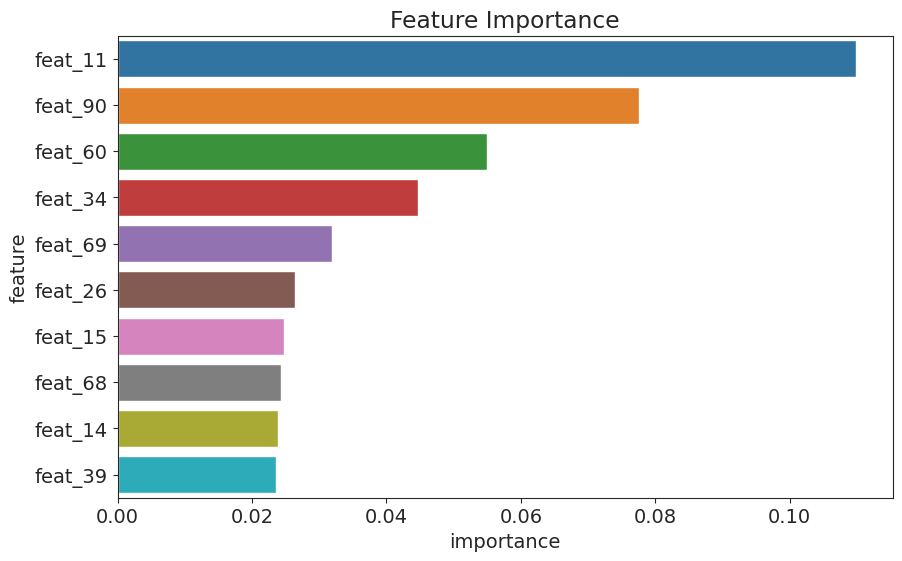

In [76]:
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

We can Note that above are the top Ten feature which contribute much to the model and prediction.

In [47]:
dic = {
    'LGBMClassifier':0.49365204995124906,
    'XGBClassifier':0.4925464304759471,
    'MLPClassifier':10.68176240687238,
    'GradientBoostingClassifier':0.5584971070753638,
    'RandomForestClassifier':  0.584482205790666,
 'LogisticRegression' :  0.6657797375094069
    
}

In [48]:
dic.keys()

dict_keys(['LGBMClassifier', 'XGBClassifier', 'MLPClassifier', 'GradientBoostingClassifier', 'RandomForestClassifier', 'LogisticRegression'])

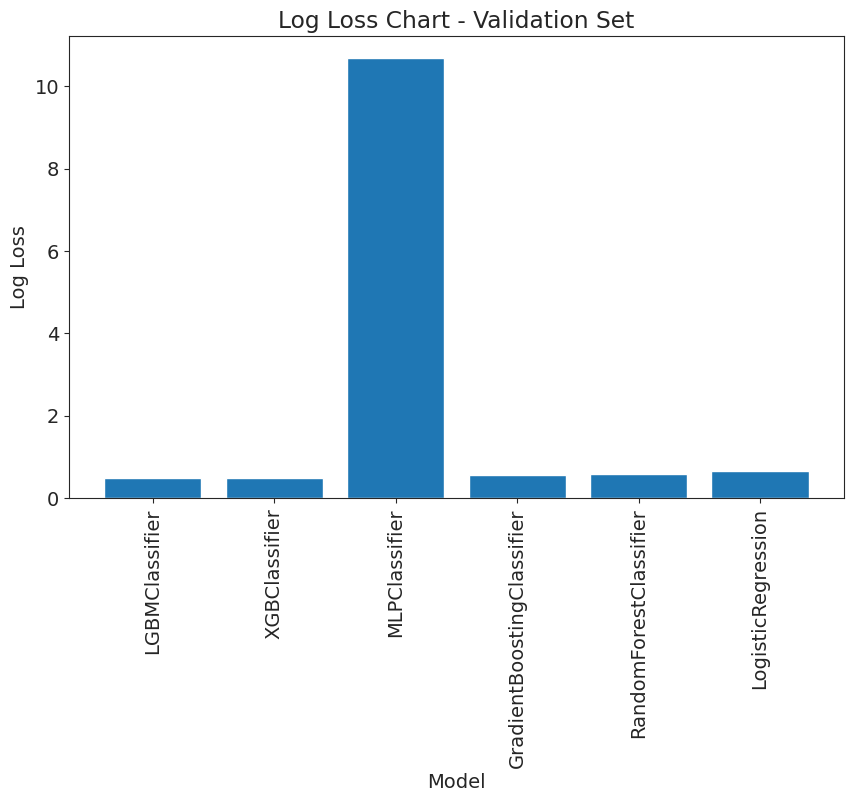

In [49]:
plt.bar(dic.keys(),dic.values())
# Add a title
plt.title('Log Loss Chart - Validation Set')

# Add labels to the x-axis
plt.xlabel('Model')

plt.xticks( rotation=90)
# Add labels to the y-axis
plt.ylabel('Log Loss')

# Show the plot
plt.show()

>**Inference**: we find 'LGBMClassifier'and 'XGBClassifier'' model with least log loss and will be choosing 'LGBMClassifier' as final model for tuning even though the 'LGBMClassifier' model has slighly higher loss, because its computation time and resiurce requirement is much less compare to the counterpart.

## Hyperparameter tuning for select models

In [60]:
#A Function to fit, predict, calculate he log loss and plot it in graph for both validation and train set
import time
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
def tuner(model_name,param_name, param_values, train_input, train_target, val_input,val_target,**best):
    train_log_loss=[]
    val_log_loss=[]
    for param in param_values:
        kwargs={param_name : param } | best
        model= model_name(**kwargs).fit( train_input,train_target)
        pred_train_proba = model.predict_proba(train_input)
        time.sleep(1)
        pred_val_proba = model.predict_proba(val_input)
        train_loss =log_loss(train_target, pred_train_proba)
        #print(f"Train set log loss : {train_loss} \n Train_proba :{pred_train_proba}")
        train_log_loss.append(train_loss)
        val_loss = log_loss(val_target, pred_val_proba) 
        #print(f"Validation set log loss : {val_loss}\n va_proba :{pred_train_proba}")
        val_log_loss.append(val_loss)
           
    df = pd.DataFrame({
        param_name: param_values,
        "train_log_loss": train_log_loss,
        "val_log_loss": val_log_loss
        })
    print(df)
    # Plot two line plots on the same figure:
    fig = px.line(df, x=param_name, y=["train_log_loss", "val_log_loss"], title='Overfitting curve: ' + param_name,color_discrete_sequence=["blue", "red"])
    # Add points to the line plot:
    fig.add_trace(go.Scatter(x=df[param_name], y=df.train_log_loss, mode="markers",marker_color="blue"))
    fig.add_trace(go.Scatter(x=df[param_name], y=df.val_log_loss, mode="markers", marker_color="red"))
    # Show the figure:        
    fig.show()



In [61]:
#train_input = train_input_scaled.iloc[:,:-3]
#val_input=val_input_scaled.iloc[:,:-3]
#val_input

### LGBM Classifier - Hyperparameter tuning

In [69]:
tuner(model_name = LGBMClassifier,
      param_name = 'n_estimators', 
      param_values= [100,200,400,700,1000,1500],
      train_input =train_input , 
      train_target = train_target_le , 
      val_input = val_input,
      val_target = val_target_le, 
      random_state=50,
      n_jobs=-1,
      boosting_type = 'gbdt'
      
     )

   n_estimators  train_log_loss  val_log_loss
0           100        0.311241      0.492991
1           200        0.211800      0.482288
2           400        0.118796      0.493652
3           700        0.059325      0.535195
4          1000        0.032351      0.591550
5          1500        0.012385      0.699060


> **Note :** As we can see from the plot the higher the N_Estimator number increase, the higher do we see the model gets overfitted to the training set. The best parameter for n_estimators is 200

In [78]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "haridev5041998/otto-group-product-classification-challenge-improving-product-classification-accuracy-with" on https://jovian.com/
[jovian] Committed successfully! https://jovian.com/haridev5041998/otto-group-product-classification-challenge-improving-product-classification-accuracy-with


'https://jovian.com/haridev5041998/otto-group-product-classification-challenge-improving-product-classification-accuracy-with'

In [72]:
tuner(model_name =  LGBMClassifier,
      param_name = 'max_depth', 
      param_values= [1,2,3,6,8,10,12,15,25,50,100],
      train_input =train_input , 
      train_target = train_target_le , 
      val_input = val_input,
      val_target = val_target_le, 
      random_state=50,
      n_jobs=-1,
     n_estimators= 200            
     )

    max_depth  train_log_loss  val_log_loss
0           1        0.700573      0.715488
1           2        0.563465      0.599966
2           3        0.474179      0.543632
3           6        0.274578      0.487106
4           8        0.235813      0.483288
5          10        0.221147      0.481224
6          12        0.216098      0.481562
7          15        0.214361      0.480834
8          25        0.212101      0.479457
9          50        0.211800      0.482288
10        100        0.211800      0.482288


> **Note :** max_depth is set to 10

In [74]:
tuner(model_name = LGBMClassifier,
      param_name = 'min_child_weight', 
      param_values= [0.0001,0.0001,0.001,0.01,0.1,1,10,100],
      train_input =train_input , 
      train_target = train_target_le , 
      val_input = val_input,
      val_target = val_target_le, 
      random_state=50,
      n_jobs=-1,
     n_estimators= 200,     
      max_depth = 10
      
     )

   min_child_weight  train_log_loss  val_log_loss
0            0.0001        0.221115      0.480747
1            0.0001        0.221115      0.480747
2            0.0010        0.221147      0.481224
3            0.0100        0.221452      0.481685
4            0.1000        0.222192      0.479392
5            1.0000        0.227736      0.478144
6           10.0000        0.269347      0.475281
7          100.0000        0.442402      0.529090


> **Note :** min_child_weight = 1 is the best parameter

In [76]:
tuner(model_name = LGBMClassifier,
      param_name = 'num_leaves ', 
      param_values= [10,31,55,90,100,150,300],
      train_input =train_input , 
      train_target = train_target_le , 
      val_input = val_input,
      val_target = val_target_le, 
      random_state=50,
      n_jobs=-1,
     n_estimators= 200,      
      max_depth = 10,
      min_child_weight = 1
      
     )

[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 31
[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 55
[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 90
[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 100
[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 150
[LightGBM] [Warning] num_leaves is set=31, num_leaves= will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] Unknown parameter: 300
   num_leaves   train_log_loss  val_log_loss
0           10        0.227736      0.478144
1           31        0.227736      0.47814

> **Note :** Some how the num_leaf parameter is set to defaul value of 31 and doesn't change. <span class="emoji">&#x1F612;</span>

In [80]:
tuner(model_name = LGBMClassifier,
      param_name = 'learning_rate', 
      param_values= [0.001,0.01,0.1,0.5,1],
      train_input =train_input , 
      train_target = train_target_le , 
      val_input = val_input,
      val_target = val_target_le, 
      random_state=50,
      n_jobs=-1,
     n_estimators= 200,      
      max_depth = 10,
      min_child_weight = 1,
      objective = 'multiclass' 
     )

   learning_rate  train_log_loss  val_log_loss
0          0.001        1.468386      1.484008
1          0.010        0.611343      0.666021
2          0.100        0.227736      0.478144
3          0.500        0.031123      0.729641
4          1.000       18.562965     18.671750


>**Note**: The best Learnin rate = 0.1



**Inference** : The best hyperparameter for the LGBM Classifier are as follow,
    
`random_state=50, n_jobs=-1, n_estimators= 200, max_depth = 10, min_child_weight = 1, objective = 'multiclass',
learning_rate =0.1`
      

#### Checking the Acuracy, Presicion, Recall, F1 Score & Log loss for the best model 

In [82]:
model_LGBMClassifier_best_1 =  model_train(model_name= LGBMClassifier, 
                                            input_val=train_input[:-3] ,
                                            target_val=train_target_le,
                                            random_state=50,
                                            n_jobs=-1,
                                            n_estimators= 200,      
                                            max_depth = 10,
                                            min_child_weight = 1,
                                            objective = 'multiclass'                              
                             )

Score: 0.9302452426164599
Multi-class Log Loss: 0.2277362598029386
              precision    recall  f1-score   support

           0       0.97      0.94      0.95      1538
           1       0.85      0.94      0.90     12915
           2       0.85      0.74      0.79      6393
           3       0.96      0.79      0.86      2155
           4       1.00      1.00      1.00      2143
           5       0.99      0.99      0.99     11331
           6       0.95      0.92      0.94      2261
           7       0.98      0.98      0.98      6800
           8       0.98      0.98      0.98      3966

    accuracy                           0.93     49502
   macro avg       0.95      0.92      0.93     49502
weighted avg       0.93      0.93      0.93     49502



In [83]:
#Validation set 
model_val(model_LGBMClassifier_best_1,val_input,val_target_le)

Score: 0.8171460892049127
Multi-class Log Loss: 0.4781441084414284
              precision    recall  f1-score   support

           0       0.74      0.52      0.61       391
           1       0.74      0.86      0.79      3207
           2       0.62      0.53      0.57      1611
           3       0.80      0.51      0.62       536
           4       0.97      0.97      0.97       596
           5       0.94      0.94      0.94      2804
           6       0.75      0.68      0.71       578
           7       0.90      0.93      0.92      1664
           8       0.86      0.88      0.87       989

    accuracy                           0.82     12376
   macro avg       0.81      0.76      0.78     12376
weighted avg       0.81      0.82      0.81     12376



## Make predictions

In [104]:
test_df

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_84,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93
0,1,0,0,0,0,0,0,0,0,0,...,0,0,11,1,20,0,0,0,0,0
1,2,2,2,14,16,0,0,0,0,0,...,0,0,0,0,0,4,0,0,2,0
2,3,0,1,12,1,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,1
3,4,0,0,0,1,0,0,0,0,0,...,0,3,1,0,0,0,0,0,0,0
4,5,1,0,0,1,0,0,1,2,0,...,0,0,0,0,0,0,0,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144363,144364,0,0,0,0,0,0,0,0,0,...,0,0,2,1,1,0,0,0,0,0
144364,144365,0,0,0,0,0,0,0,0,0,...,0,1,4,1,11,0,0,0,0,0
144365,144366,0,1,0,0,0,0,1,1,0,...,0,1,3,1,1,0,0,1,0,0
144366,144367,0,0,0,0,0,0,0,0,0,...,0,0,0,0,5,0,0,0,1,0


In [119]:
# Feature creation for test/submisson set

sum_1 = test_df.iloc[:,1:].sum(axis=1)
var_1 = test_df.iloc[:,1:].var(axis=1)
temp2=test_df.iloc[:,1:] ==0

feat_count_2 =list()

j=0
for i in range(0,temp2.shape[0]):
    j=+1
    if temp2.iloc[i].value_counts()[0] !=93:
        val=temp2.iloc[i].value_counts()[1]
    else:
        val = 0
    feat_count_2.append( val )   




test_df['feat_count']=feat_count_2
test_df['feat_var'] =var_1
test_df['feat_sum']=sum_1

In [130]:
test_df

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,feat_count,feat_var,feat_sum
0,1,0,0,0,0,0,0,0,0,0,...,1,20,0,0,0,0,0,19,6.054231,61
1,2,2,2,14,16,0,0,0,0,0,...,0,0,4,0,0,2,0,22,12.751753,120
2,3,0,1,12,1,0,0,0,0,0,...,0,2,0,0,0,0,1,34,4.500000,93
3,4,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,16,6.834035,67
4,5,1,0,0,1,0,0,1,2,0,...,0,0,0,0,9,0,0,17,4.764376,63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144363,144364,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,18,1.370266,36
144364,144365,0,0,0,0,0,0,0,0,0,...,1,11,0,0,0,0,0,9,1.611734,25
144365,144366,0,1,0,0,0,0,1,1,0,...,1,1,0,0,1,0,0,29,4.573866,71
144366,144367,0,0,0,0,0,0,0,0,0,...,0,5,0,0,0,1,0,11,1.554231,32


In [131]:
final_model = LGBMClassifier(random_state=50,
                                n_jobs=-1,
                                n_estimators= 200,      
                                max_depth = 10,
                                min_child_weight = 1,
                                objective = 'multiclass').fit(train_input,train_target_le)

In [132]:
predict_proba_= final_model.predict_proba(test_df.iloc[:,1:])
submission_df = pd.DataFrame(predict_proba_,columns=["Class_"+str(i) for i in range(1,10)])
submission_df.insert(loc=0, column='id', value=test_df.id)
submission_df.to_csv('submission.csv', index=False)


In [133]:
submission_df

,id,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,1,0.000076,0.153711,0.326987,0.513090,7.852142e-06,0.000291,0.005467,0.000209,0.000161
1,2,0.000205,0.006686,0.000160,0.000254,3.537504e-05,0.898968,0.000516,0.093138,0.000037
2,3,0.000006,0.000026,0.000014,0.000005,3.891558e-08,0.999794,0.000018,0.000135,0.000001
3,4,0.000066,0.627705,0.367100,0.004104,2.019983e-06,0.000035,0.000059,0.000137,0.000792
4,5,0.030159,0.000147,0.000188,0.000020,4.304232e-06,0.000424,0.000433,0.017707,0.950918
...,...,...,...,...,...,...,...,...,...,...
144363,144364,0.876059,0.002165,0.002638,0.002737,3.856667e-06,0.085690,0.004778,0.009292,0.016637
144364,144365,0.000184,0.260140,0.579197,0.048787,2.945316e-06,0.000625,0.110781,0.000115,0.000169
144365,144366,0.000403,0.496540,0.463556,0.036391,1.968231e-05,0.000394,0.002336,0.000294,0.000066
144366,144367,0.000037,0.195610,0.014553,0.789441,4.183156e-07,0.000036,0.000298,0.000014,0.000010


## Submitting to Kaggle

<a href="https://www.kaggle.com/competitions/otto-group-product-classification-challenge">Kaggle Competition Link</a>

<img src="https://i.imgur.com/eSEmonV.png" alt="Image" width="auto" height="auto">

## Summary

The Otto Group is a large e-commerce company that is looking to use machine learning to improve the accuracy of their product classification. They have a dataset of 93 features for more than 200,000 products. The objective of the challenge is to build a predictive model that can distinguish between their main product categories.

The challenge was approached using a machine learning pipeline that included the following steps:

* Exploratory data analysis (EDA) to understand the data and identify potential features to use in the model.
* Feature engineering to create new features from the existing features.
* Data preparation, including splitting the data into train and validation sets, and scaling the features.
* Model training and evaluation, using a variety of models, including logistic regression, decision trees, random forests, and gradient boosting machines.
* Hyperparameter tuning to improve the performance of the best model.

The best model was a **LightGBM classifier** with the following hyperparameters:

<ul>
<li>random_state=50</li>
<li>n_jobs=-1</li>
<li>n_estimators= 200</li>
<li>max_depth = 10</li>
<li>min_child_weight = 1</li>
<li>objective = 'multiclass'</li>
<li>learning_rate =0.1</li>
</ul>

The model achieved a log loss of **0.47** on the Submission, which is a good result.


<h2>Future Work</h2>

<ul>
<li><strong>Feature selection</strong>: Reduce the number of features and focus on the most important ones.</li>
<li><strong>Use neural networks</strong>: Learn long-term dependencies in the data.</li>
<li><strong>Stack models</strong>: Combine the predictions of multiple models.</li>
<li><strong>Make pipeline more robust</strong>: Improve the reliability and reproducibility of the model.</li>
<li><strong>Use multi-stage multi-model integration</strong>: Combine the predictions of multiple models at different stages of the pipeline.</li>
</ul>


## Reference

<ul>
  <li><a href="https://scikit-learn.org/stable/index.html">scikit-learn</a></li>
  <li><a href="https://lightgbm.readthedocs.io/en/latest/_modules/lightgbm/sklearn.html">lightgbm</a></li>
  <li><a href="https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/">XGBoost Parameter Tuning</a></li>
  <li><a href="https://xgboost.readthedocs.io/">xgboost</a></li>
  <li><a href="https://jovian.com/meenakshi-ravikumar/product-classification-challenge-otto-group#C0">Product Classification Challenge by meenakshi-ravikumar</a></li>
  <li><a href="https://jovian.com/anushree-k/final-walmart-simple-rf-gbm#C332">final-walmart-simple-rf-gbm by Anushree K</a></li>
  <li><a href="https://jovian.com/learn/zero-to-data-analyst-bootcamp/lesson/gradient-boosting-machines-with-xgboost">Gradient Boosting Machines with XGBoost by Aakash N S</a></li>
</ul>